In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.manifold import Isomap, LocallyLinearEmbedding, SpectralEmbedding, TSNE, MDS
from sklearn.decomposition import PCA

from time import time
from matplotlib.ticker import NullFormatter

from scipy.sparse.linalg import eigs

### import data and preprocess

In [3]:
import scipy.io
file = scipy.io.loadmat('univ_cn.mat')
file.keys()

dict_keys(['__header__', '__version__', '__globals__', 'univ_cn', 'W_cn', 'rank_cn'])

In [4]:
Y = file['univ_cn']

In [7]:
print('The shape of Y is {}'.format(Y.shape))
print('The shape of rank_cn is {}'.format(file['rank_cn'].shape))
print('The shape of W_cn is {}'.format(file['W_cn'].shape))

The shape of Y is (1, 76)
The shape of rank_cn is (76, 1)
The shape of W_cn is (76, 76)


In [8]:
# See one sample in Y
print('The first sample in Y is {}'.format(Y[0][0]))

The first sample in Y is ['pku.edu.cn']


In [9]:
n = Y.shape[1]
print('the number of universities are:', n)

the number of universities are: 76


In [13]:
# get the names of the universities
univ = [Y[0][i][0].split('.')[0] for i in range(n)]

In [14]:
# get the link matrix, whose (i,j)−th element gives the number of links 
# from univerdity i to university j 
w = file['W_cn']
print(w.shape)

(76, 76)


In [15]:
# get the research ranking of these universities
research_rank = file['rank_cn'].reshape((n,))
research_idx = np.arange(n,)

In [17]:
print('research ranking:')
print(univ)
print(research_rank)

research ranking:
['pku', 'tsinghua', 'fudan', 'nju', 'zju', 'ustc', 'sjtu', 'buaa', 'nankai', 'tju', 'bnu', 'hit', 'jlu', 'hust', 'ruc', 'whu', 'scu', 'bit', 'tongji', 'xmu', 'zsu', 'dlut', 'cau', 'seu', 'ecnu', 'nwpu', 'scut', 'ustb', 'sdu', 'neu', 'bupt', 'csu', 'lzu', 'njust', 'nip', 'njtu', 'nuaa', 'cqu', 'nenu', 'jnu', 'njau', 'swjtu', 'ouqd', 'cumt', 'ecust', 'cug', 'gzsums', 'ccnu', 'hzau', 'xidian', 'shsmu', 'uestc', 'bfsu', 'shufe', 'nwu', 'scau', 'ccom', 'shisu', 'fzu', 'sdust', 'cun', 'swufe', 'dlmu', 'hfut', 'uibe', 'cpums', 'cupl', 'usst', 'njmu', 'sicau', 'cdut', 'tyut', 'henu', 'xju', 'znufe', 'njim']
[  1   1   3   4   5   6   7   8   8   8  11  11  11  14  14  14  17  18
  18  20  20  22  23  23  25  25  25  25  29  30  31  31  31  31  35  35
  35  38  38  40  40  40  43  43  43  46  46  49  49  49  52  52  57  57
  62  64  66  66  72  72  80  80  86  86  86  90  93  93  97  97 105 105
 109 109 109 127]


### Pagerank

In [18]:
def UnivPageRank(alpha, w):
    '''
    input: the Google’s hyperparameter alpha, the link matrix w,
    output: pagerank_score, university ranking according to pagerank
    '''
    # compute the out-degree vector (number of out-links from each university)
    d0 = np.sum(w, axis = 1)
    
    # compute the markov matrix
    n = w.shape[0]
    indices = [i for i in range(n) if d0[i]>0]
    P1 = np.zeros((n,n))
    for i in indices:
        P1[i,:] = w[i,:] / d0[i]
    
    #pagerank
    P = P1 * alpha + (1 - alpha) * np.ones((n,n)) / n
    #compute the latgest eigenvalue of P' and its corresponding eigenvector
    leval, levec = eigs(P.T,1)
    levec = levec.reshape((n,))
    
    pagerank_score = np.abs(levec/np.sum(levec))
    
    #indeices of the scores in descending order
    pagerank_idx = np.argsort(-pagerank_score)
    
    #university ranking according to pagerank
    univ_pagerank = [univ[i] for i in pagerank_idx]
    
    return pagerank_score, pagerank_idx, univ_pagerank

In [19]:
pagerank_score, pagerank_idx, univ_pagerank = UnivPageRank(0.85,w)
print(univ_pagerank)

['tsinghua', 'pku', 'sjtu', 'nju', 'uestc', 'scut', 'zsu', 'dlut', 'fudan', 'seu', 'zju', 'ustc', 'hust', 'gzsums', 'jnu', 'whu', 'bnu', 'tju', 'lzu', 'ecnu', 'tongji', 'swjtu', 'xmu', 'nankai', 'jlu', 'bupt', 'ruc', 'bfsu', 'njau', 'sdu', 'fzu', 'nuaa', 'hit', 'cau', 'cumt', 'njtu', 'swufe', 'xidian', 'bit', 'neu', 'njust', 'buaa', 'cqu', 'ecust', 'nwu', 'nwpu', 'shufe', 'cug', 'nenu', 'tyut', 'ccnu', 'njmu', 'xju', 'scau', 'dlmu', 'ouqd', 'znufe', 'shsmu', 'shisu', 'ustb', 'sicau', 'hfut', 'njim', 'ccom', 'cupl', 'scu', 'uibe', 'henu', 'cpums', 'usst', 'hzau', 'csu', 'cdut', 'cun', 'sdust', 'nip']


### HITS authority ranking

In [20]:
u,s,vh = np.linalg.svd(w)

In [21]:
authority_score = vh[0,:] / np.sum(vh[0,:])
authority_idx = np.argsort(-authority_score)
univ_authrank = [univ[i] for i in authority_idx]
print(univ_authrank)

['tsinghua', 'pku', 'uestc', 'sjtu', 'nju', 'fudan', 'zsu', 'scut', 'zju', 'gzsums', 'seu', 'tju', 'whu', 'hust', 'ecnu', 'tongji', 'dlut', 'xmu', 'jlu', 'nankai', 'bnu', 'ustc', 'ruc', 'hit', 'cau', 'bupt', 'sdu', 'jnu', 'buaa', 'lzu', 'cqu', 'njtu', 'fzu', 'cumt', 'njust', 'nwpu', 'ecust', 'swjtu', 'neu', 'nuaa', 'xidian', 'njau', 'nwu', 'bit', 'swufe', 'ccnu', 'nenu', 'tyut', 'cug', 'scau', 'shufe', 'hfut', 'njmu', 'shsmu', 'sicau', 'xju', 'ouqd', 'shisu', 'ccom', 'znufe', 'ustb', 'njim', 'dlmu', 'scu', 'uibe', 'henu', 'bfsu', 'cpums', 'cupl', 'hzau', 'usst', 'csu', 'cun', 'sdust', 'cdut', 'nip']


### HITS hub ranking

In [22]:
hub_score = u[:,0] / np.sum(u[:,0])
hub_idx = np.argsort(-hub_score)
univ_hubrank = [univ[i] for i in hub_idx]
print(univ_hubrank)

['pku', 'ustc', 'zsu', 'sjtu', 'zju', 'seu', 'njau', 'whu', 'tju', 'tsinghua', 'hit', 'sdu', 'cau', 'lzu', 'swufe', 'fudan', 'nju', 'scu', 'scau', 'jlu', 'bnu', 'tyut', 'nenu', 'cug', 'gzsums', 'hzau', 'neu', 'ccnu', 'ecnu', 'hust', 'scut', 'tongji', 'swjtu', 'nwpu', 'jnu', 'nankai', 'dlut', 'fzu', 'shufe', 'nwu', 'bfsu', 'xidian', 'sicau', 'ruc', 'cun', 'znufe', 'sdust', 'cqu', 'njust', 'dlmu', 'xju', 'cdut', 'njtu', 'nip', 'bupt', 'cupl', 'henu', 'ouqd', 'csu', 'nuaa', 'shisu', 'bit', 'uestc', 'cumt', 'njim', 'njmu', 'ustb', 'cpums', 'buaa', 'xmu', 'uibe', 'hfut', 'usst', 'ecust', 'ccom', 'shsmu']


所有的排名可以画一张表格（选取几个学校）

### Compare these rankings against the research ranking

Spearman’s $\rho$ rank correlation coefficient

In [25]:
from scipy import stats
stats.spearmanr(research_idx,pagerank_idx)

SpearmanrResult(correlation=0.7055639097744362, pvalue=1.1053900271970499e-12)

In [26]:
stats.spearmanr(research_idx,authority_idx)

SpearmanrResult(correlation=0.7505126452494874, pvalue=5.944060997007626e-15)

In [27]:
stats.spearmanr(research_idx,hub_idx)

SpearmanrResult(correlation=0.5395762132604237, pvalue=4.914937264782889e-07)

In [28]:
stats.spearmanr(pagerank_idx,authority_idx)

SpearmanrResult(correlation=0.5718933697881067, pvalue=6.800628098195791e-08)

In [29]:
stats.spearmanr(pagerank_idx,hub_idx)

SpearmanrResult(correlation=0.40431989063568013, pvalue=0.0002919635856878437)

In [203]:
stats.spearmanr(authority_idx,hub_idx)

SpearmanrResult(correlation=0.44133971291866037, pvalue=6.588812828474466e-05)

Kendall $\tau$ distance

In [204]:
stats.kendalltau(research_idx,pagerank_idx)

KendalltauResult(correlation=0.5200000000000001, pvalue=3.000136824018467e-11)

In [205]:
stats.kendalltau(research_idx,authority_idx)

KendalltauResult(correlation=0.5719298245614035, pvalue=2.664997636484326e-13)

In [206]:
stats.kendalltau(research_idx,hub_idx)

KendalltauResult(correlation=0.3782456140350878, pvalue=1.3335979791583285e-06)

In [207]:
stats.kendalltau(pagerank_idx,authority_idx)

KendalltauResult(correlation=0.40631578947368424, pvalue=2.064111362087092e-07)

In [208]:
stats.kendalltau(pagerank_idx,hub_idx)

KendalltauResult(correlation=0.2715789473684211, pvalue=0.0005179787515433144)

In [209]:
stats.kendalltau(authority_idx,hub_idx)

KendalltauResult(correlation=0.3164912280701755, pvalue=5.22461859711439e-05)

这里可以画两张表格

### Change the Google's hyperparameters $\alpha$

In [30]:
alphaset = np.array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.85, 0.9])

In [31]:
n_alpha = alphaset.shape[0] # shape of alphaset
pageranks_idx = np.zeros((n,n_alpha))

for i in range (n_alpha):
    pageranks_idx[:,i] = UnivPageRank(alphaset[i],w)[1]

In [32]:
pageranks_idx+1

array([[ 2.,  2.,  2.,  2.,  2.,  2.,  2.,  2.,  2.],
       [ 1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.],
       [52., 52.,  4.,  7.,  7.,  7.,  7.,  7.,  7.],
       [ 4.,  4.,  7.,  4.,  4.,  4.,  4.,  4.,  4.],
       [ 7.,  7., 52., 52., 52., 52., 52., 52., 52.],
       [21., 21., 27., 27., 27., 27., 27., 27., 27.],
       [27., 27., 21., 21., 21., 21., 21., 21., 21.],
       [ 3.,  3.,  3.,  3., 22., 22., 22., 22., 22.],
       [24., 24., 24., 22.,  3.,  3.,  3.,  3.,  3.],
       [22., 22., 22., 24., 24., 24., 24., 24., 24.],
       [14.,  5.,  5.,  5.,  5.,  5.,  5.,  5.,  5.],
       [ 5., 14., 14., 14., 14., 14.,  6.,  6.,  6.],
       [53., 53.,  6.,  6.,  6.,  6., 14., 14., 14.],
       [ 6.,  6., 47., 47., 47., 47., 47., 47., 47.],
       [47., 47., 53., 40., 40., 40., 40., 40., 40.],
       [40., 40., 40., 16., 16., 16., 16., 16., 16.],
       [16., 16., 16., 53., 53., 11., 11., 11., 11.],
       [11., 11., 11., 11., 11., 10., 10., 10., 10.],
       [42., 42., 42., 42., 

#### plot page ranking with different $\alpha$

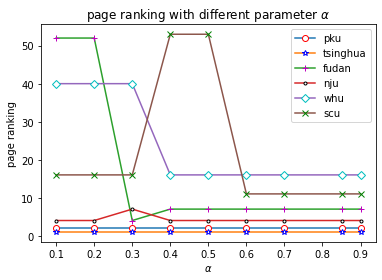

In [33]:
plt.plot(alphaset, pageranks_idx[0,:]+1, marker='o', mec='r', mfc='w',label='pku')
plt.plot(alphaset, pageranks_idx[1,:]+1, marker='*', mec='b', mfc='w',label='tsinghua')
plt.plot(alphaset, pageranks_idx[2,:]+1, marker='+', mec='m', mfc='w',label='fudan')
plt.plot(alphaset, pageranks_idx[3,:]+1, marker='.', mec='k', mfc='w',label='nju')
plt.plot(alphaset, pageranks_idx[15,:]+1, marker='D', mec='c', mfc='w',label='whu')
plt.plot(alphaset, pageranks_idx[16,:]+1, marker='x', mec='g', mfc='w',label='scu')
plt.legend()  
plt.xlabel(r'$\alpha$')
plt.ylabel(r'page ranking')
plt.title(r"page ranking with different parameter $\alpha$")
plt.savefig('page ranking with different parameter alpha.pdf')

#### plot Spearman’s rank correlation coefficient and Kendall $\tau$ distance with different $\alpha$

In [34]:
spearmanr_alpha = np.zeros((n_alpha,))
kendalltau_alpha = np.zeros((n_alpha,))
spearmanr_alpha_p = np.zeros((n_alpha,))
kendalltau_alpha_p = np.zeros((n_alpha,))
for i in range (n_alpha):
    spearmanr_alpha[i] = stats.spearmanr(research_idx,pageranks_idx[:,i])[0]
    kendalltau_alpha[i] = stats.kendalltau(research_idx,pageranks_idx[:,i])[0]
    spearmanr_alpha_p[i] = stats.spearmanr(research_idx,pageranks_idx[:,i])[1]
    kendalltau_alpha_p[i] = stats.kendalltau(research_idx,pageranks_idx[:,i])[1]

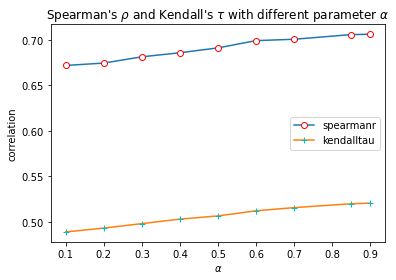

In [35]:
plt.plot(alphaset, spearmanr_alpha, marker='o', mec='r', mfc='w',label='spearmanr')
plt.plot(alphaset, kendalltau_alpha, marker='+', mec='c', mfc='w',label='kendalltau')
plt.legend()
plt.xlabel(r'$\alpha$')
plt.ylabel(r'correlation')
plt.title(r"Spearman's $\rho$ and Kendall's $\tau$ with different parameter $\alpha$")
plt.savefig('Spearman and Kendall with different parameter alpha.pdf')

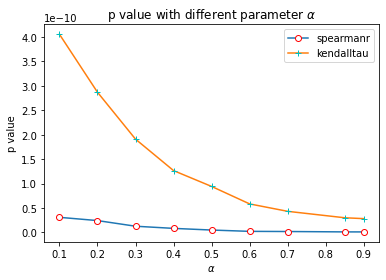

In [36]:
plt.plot(alphaset, spearmanr_alpha_p, marker='o', mec='r', mfc='w',label='spearmanr')
plt.plot(alphaset, kendalltau_alpha_p, marker='+', mec='c', mfc='w',label='kendalltau')
plt.legend()
plt.xlabel(r'$\alpha$')
plt.ylabel(r'p value')
plt.title(r"p value with different parameter $\alpha$")
plt.savefig('Spearman and Kendall p value with different parameter alpha.pdf')

### visualize the links between universities

In [37]:
w

array([[  0, 159,  34, ...,   7,   7,   6],
       [ 53,   0,  12, ...,   5,   4,   4],
       [ 18,  17,   0, ...,   2,   2,   3],
       ...,
       [  1,   2,   1, ...,   0,   1,   1],
       [  3,   3,   4, ...,   1,   0,   1],
       [  1,   0,   0, ...,   0,   0,   0]], dtype=uint8)

In [39]:
! pip install networkx
import networkx as nx
import random

     |████████████████████████████████| 1.6 MB 284 kB/s eta 0:00:01


In [40]:
# Create DiGraph from A
G = nx.from_numpy_matrix(w, create_using=nx.MultiDiGraph())

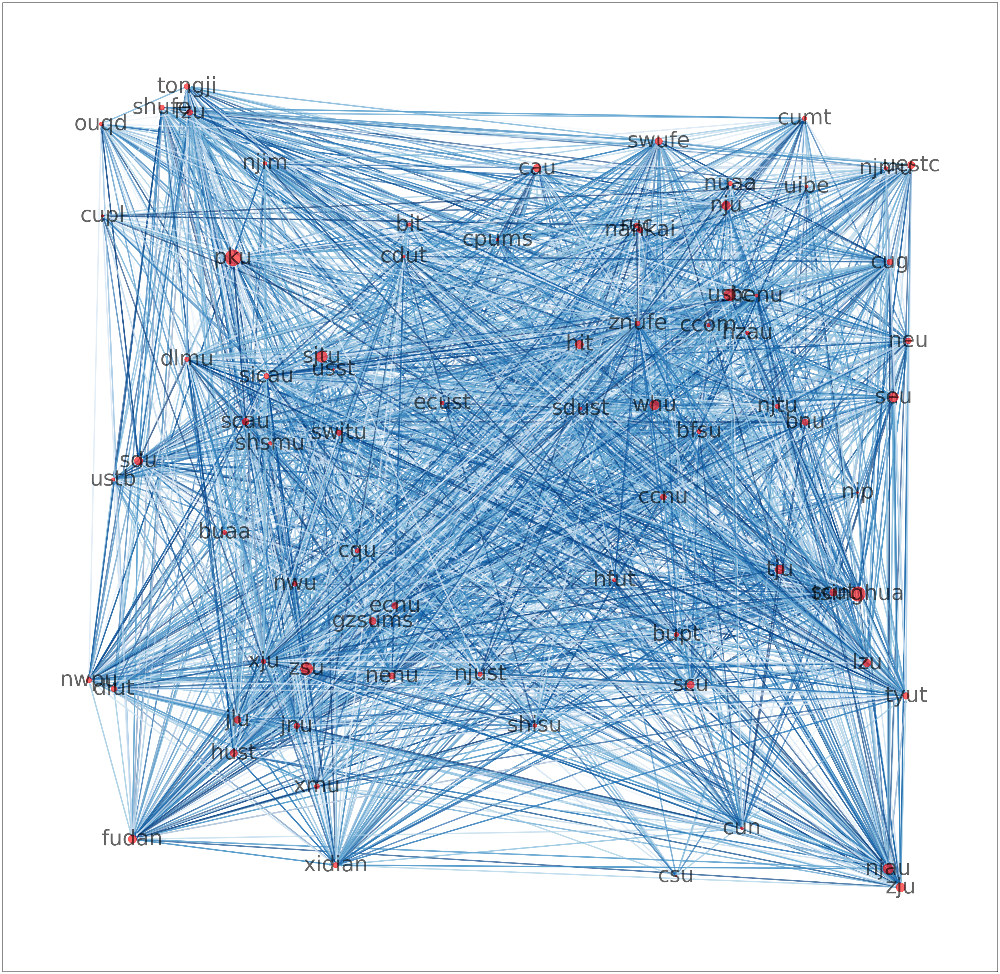

In [57]:
pos = nx.random_layout(G)
labeldict = {i : univ[i] for i in range(n)}
weight = [np.sum(w[:,i])+np.sum(w[i,:]) for i in range(n)]
#colors = range(n)
plt.figure(figsize=(50,50))

for u,v,d in G.edges(data=True):
    d['weight'] = random.random()

edges,weights = zip(*nx.get_edge_attributes(G,'weight').items())

options = {
    "node_color": "red",
    "edge_color": weights,
    "width": 4,
    "edge_cmap": plt.cm.Blues,
    "with_labels": True,
    "labels": labeldict,
    "font_size" :60,
    "node_size": weight,
    "alpha":0.6
}
nx.draw_networkx(G, pos, **options)
#nx.draw_networkx_labels(G, pos, labels, font_size=10)
plt.savefig('Network.pdf')
plt.show()

In [58]:
weight = [np.sum(w[:,i])+np.sum(w[i,:]) for i in range(n)]

In [60]:
np.save('weight',weight)